# Analysing general behaviour via tracked `trx.mat` data
Sharbat (on 2025-04-23) has decided to split up the Jupyter Notebook dealing with both Chore and `trx.mat` file processing into two notebooks.

This notebook deals with just the information read from the `trx.mat` files.


In [1]:
import os
import sys
import src.trx_processor as trx_processor
import matplotlib.pyplot as plt 
plt.style.use('../anemotaxis.mplstyle')
%matplotlib widget
%load_ext autoreload
%autoreload 2

In [23]:
base_path_control = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
trx_path = os.path.join(base_path, "20240219_140808/trx.mat")
# trx_path = os.path.join(base_path, "20240308_124423/trx.mat")
# trx_path = os.path.join(base_path, "20240308_104430/trx.mat")
# trx_path = os.path.join(base_path, "20240301_121446/trx.mat")
# trx_path = os.path.join(base_path, "20240219_143334/trx.mat")
# trx_path = os.path.join(base_path, "20240304_151714/trx.mat")
# trx_path = os.path.join(base_path, "20240223_112627/trx.mat")
# trx_path = os.path.join(base_path, "20240219_140808/trx.mat")
# trx_path = os.path.join(base_path, "20240219_145347/trx.mat")
# trx_path = os.path.join(base_path, "20240223_115010/trx.mat")

In [24]:
# Process a single trx.mat file
date_str, extracted_data, metadata = trx_processor.process_single_file(trx_path)

# print(f"\nProcessed file metadata:")
print(f"Date: {metadata['date']}")
print(f"Number of larvae: {metadata['n_larvae']}")

Processing larvae:   0%|          | 0/59 [00:00<?, ?it/s]

Date: 2024-02-19 00:00:00
Number of larvae: 59


In [25]:
# Process all trx files in a directory tree
all_data_control = trx_processor.process_all_trx_files(base_path_control)
all_data = trx_processor.process_all_trx_files(base_path)

print(f"\nProcessed all files:")
print(f"Total experiments: {len(all_data['metadata']['experiments'])}")
print(f"Total larvae: {all_data['metadata']['total_larvae']}")  # Remove len() as total_larvae is already an integer

Found 8 trx.mat files


Processing trx files:   0%|          | 0/8 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/71 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/65 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/39 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/47 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/38 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/41 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]


Processed 8 files
Total larvae: 415
Found 6 trx.mat files


Processing trx files:   0%|          | 0/6 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/10 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/39 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/23 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/51 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/59 [00:00<?, ?it/s]

Processing larvae:   0%|          | 0/74 [00:00<?, ?it/s]


Processed 6 files
Total larvae: 256

Processed all files:
Total experiments: 6
Total larvae: 256


In [30]:
# Filter using percentile threshold (bottom 10% removed)
# filtered_data = trx_processor.filter_larvae_by_duration(extracted_data, percentile=10)

# Or specify minimum duration in seconds|
filtered_extracted_data = trx_processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
filtered_all_data_control = trx_processor.filter_larvae_by_duration(all_data_control, min_total_duration=300)
filtered_all_data = trx_processor.filter_larvae_by_duration(all_data, min_total_duration=300)

# Print filtering results
# n_original = len(extracted_data)
# n_filtered = len(filtered_extracted_data)
# print(f"Filtered out {n_original - n_filtered} larvae ({(n_original - n_filtered)/n_original*100:.1f}%)")

In [31]:
# For all experiments
# stats = trx_processor.analyze_behavior_durations(filtered_all_data, title=f"Behavior Durations - {date_str}")

/Users/sharbat/Projects/anemotaxis/src/trx_processor.py:756: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


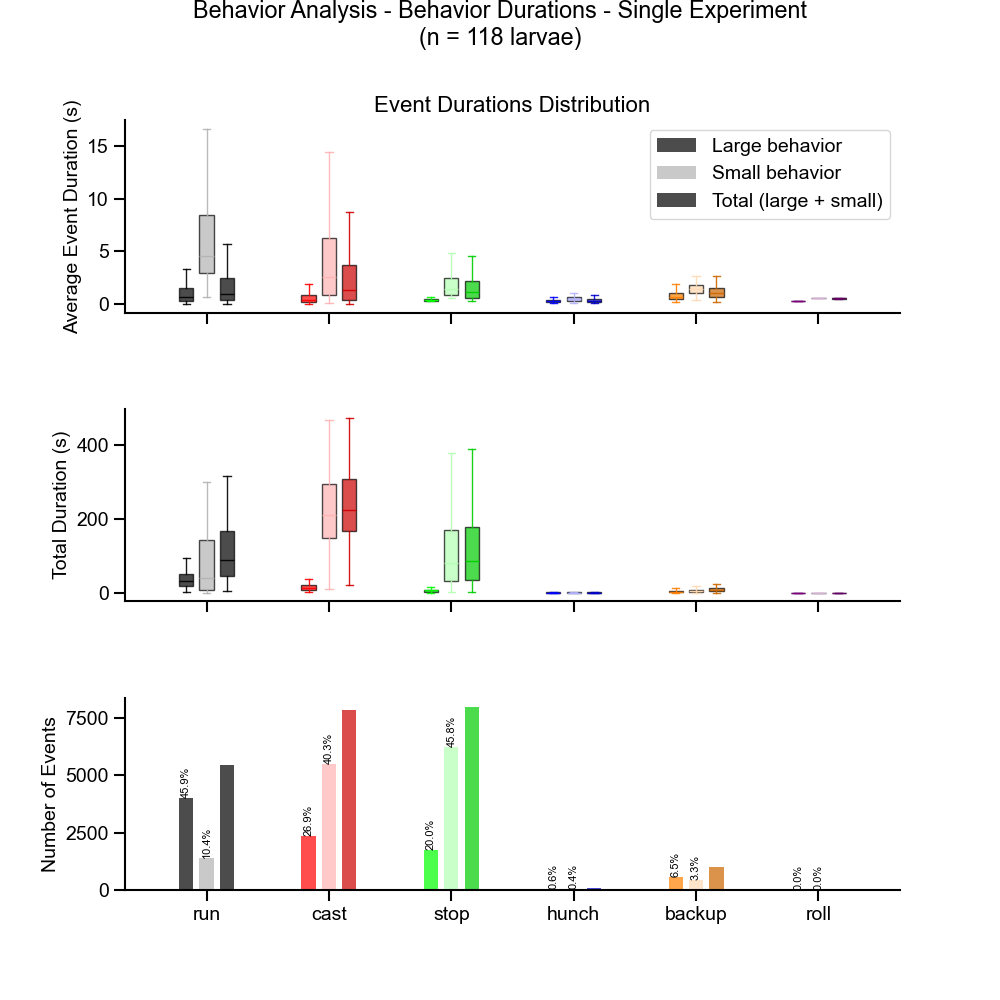


Large Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 118
Total actions: 8792

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     4036   45.9%      1.02       0.62
        cast:     2367   26.9%      0.68       0.35
        stop:     1759   20.0%      0.38       0.36
       hunch:       55    0.6%      0.27       0.22
      backup:      574    6.5%      0.75       0.67
        roll:        1    0.0%      0.23       0.23

Small Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 118
Total actions: 13644

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     1413   10.4%      6.62       4.49
        cast:     5492   40.3%      4.77       2.57
        stop:     6244   45.8%      2.22       1.37
       hunch:       48    0.4%      0.46       0.44
      backup:      445   

In [32]:
# For all experiments
stats = trx_processor.analyze_behavior_durations(filtered_all_data, title="Behavior Durations - Single Experiment")

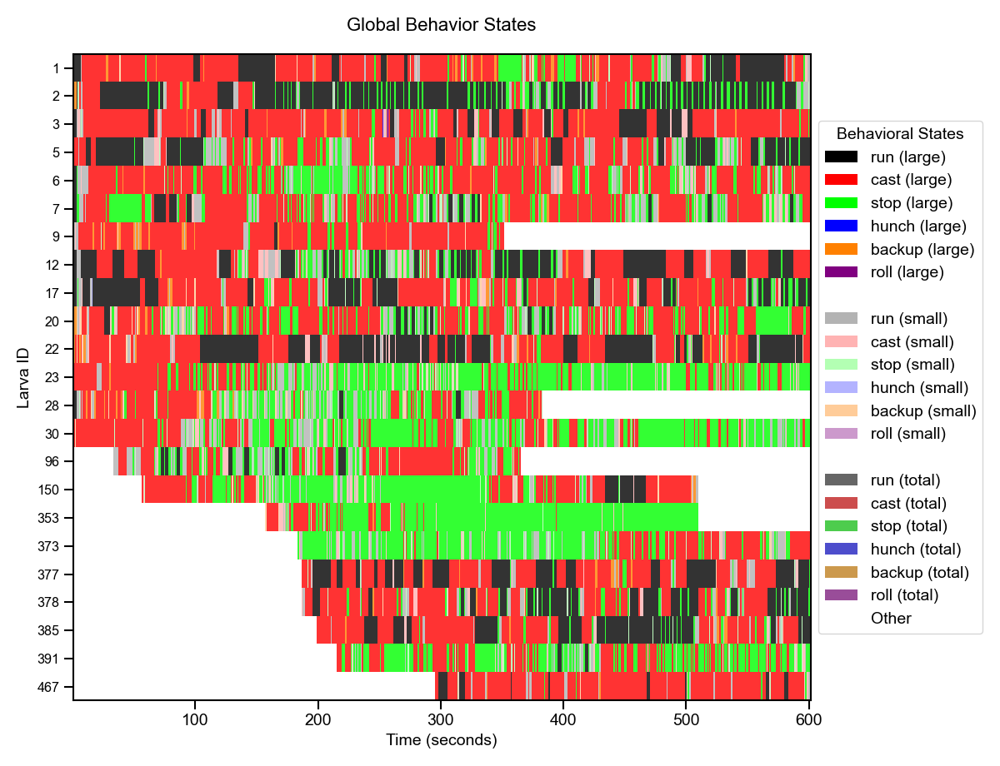

array([[[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [0.7, 0.7, 0.7],
        [0.7, 0.7, 0.7],
        [0.7, 0.7, 0.7]],

       [[1. , 0.5, 0. ],
        [1. , 0.5, 0. ],
        [1. , 0.5, 0. ],
        ...,
        [0.7, 0.7, 0.7],
        [0.7, 0.7, 0.7],
        [0.7, 0.7, 0.7]],

       [[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]],

       ...,

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [0. , 1. , 0. ],
        [0. , 1. , 0. ],
        [0.7, 0.7, 0.7]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [0.7, 0.7, 0.7],
        [0. , 1. , 0. ],
        [0. , 1. , 0. ]]

In [33]:
# Show large, small, and total behavior rows
# trx_processor.plot_global_behavior_matrix(filtered_extracted_data, show_separate_totals=True)

# Or to show just one row per larva (original behavior)
trx_processor.plot_global_behavior_matrix(filtered_extracted_data, show_separate_totals=False)

In [34]:
# # Save video of the first larva's behavior
# first_larva = sorted(filtered_extracted_data.keys())[0]
# trx_processor.save_behavioral_contour_video(
#     filtered_extracted_data, 
#     first_larva,
#     output_path='../results/larva_behavior_withstates.mp4',
#     fps=20
# )

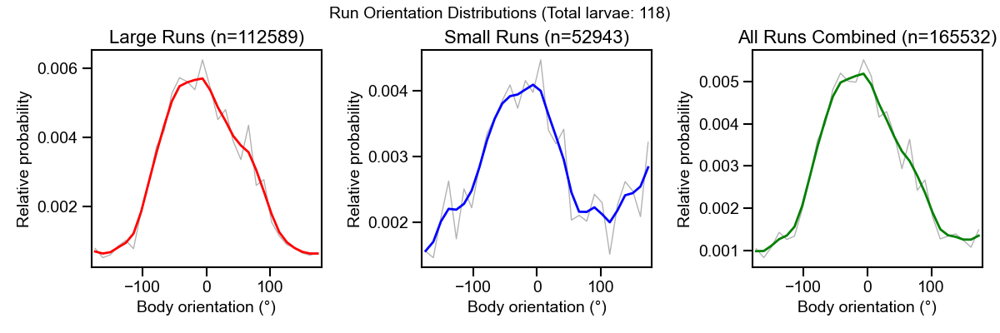

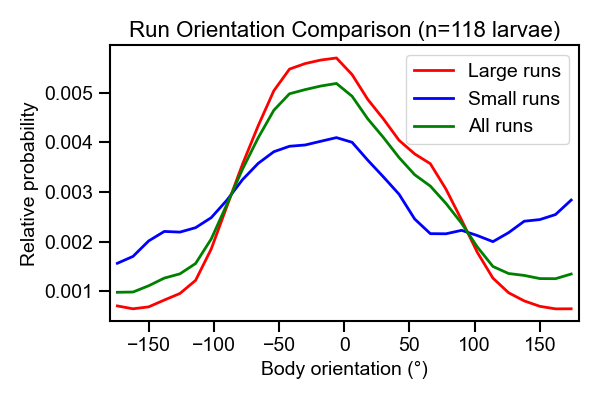

In [35]:
# For all experiments
all_exp_results = trx_processor.analyze_run_orientations_all(filtered_all_data)

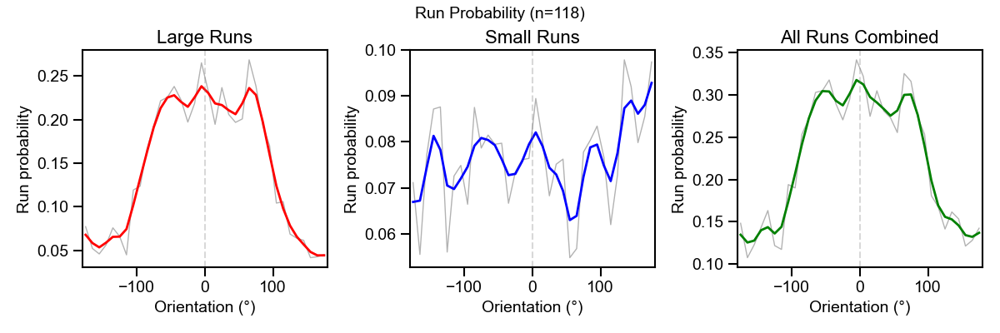

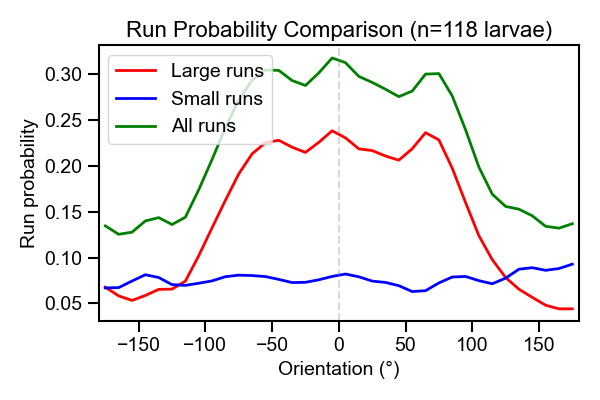

In [36]:
# Calculate run probability as a function of orientation
run_prob_results = trx_processor.analyze_run_rate_by_orientation(filtered_all_data)

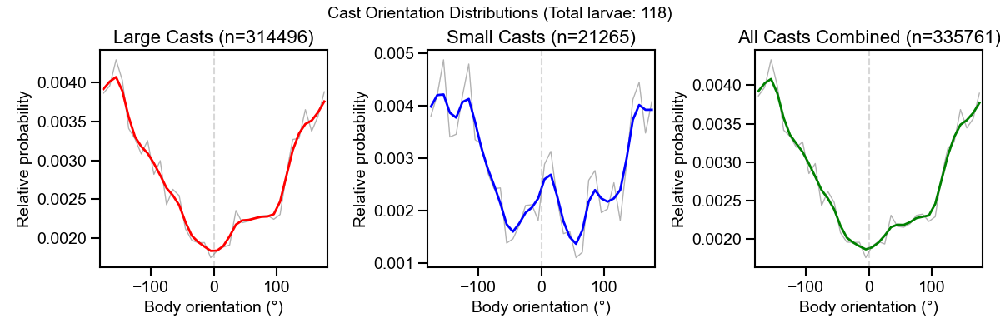

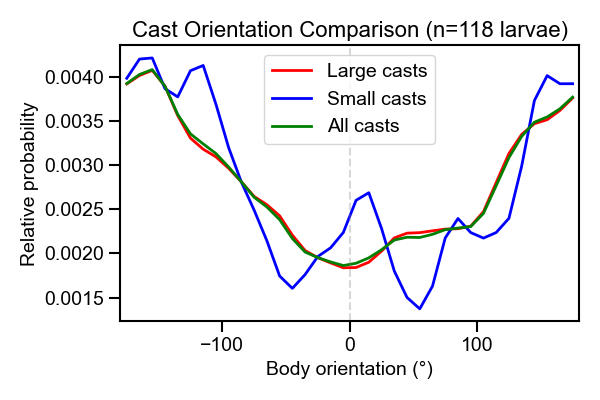

In [37]:
# Example usage
cast_results = trx_processor.analyze_cast_orientations_all(filtered_all_data)


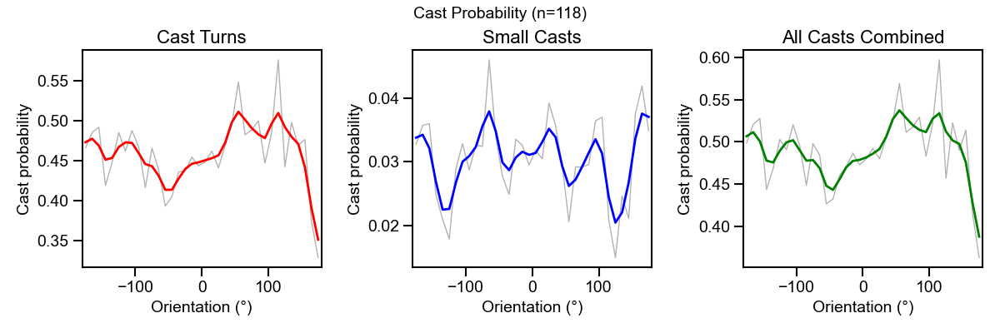

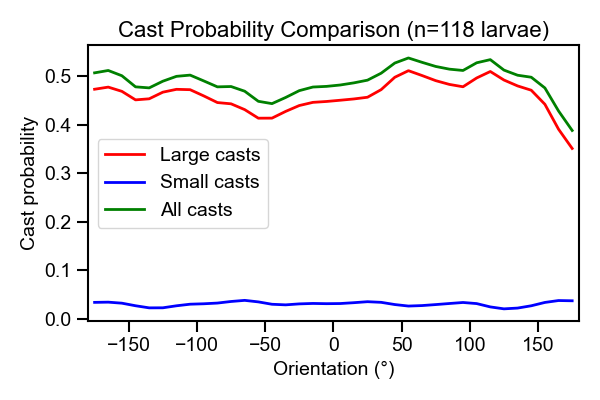

In [38]:
# Analyze all data
all_larvae_turns = trx_processor.analyze_turn_rate_by_orientation(filtered_all_data)

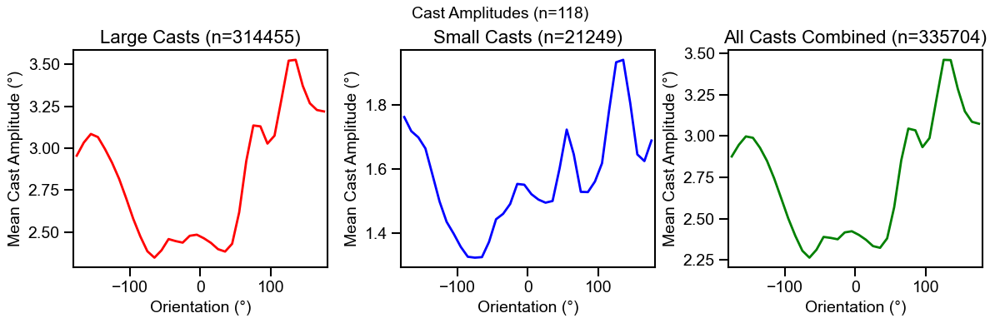

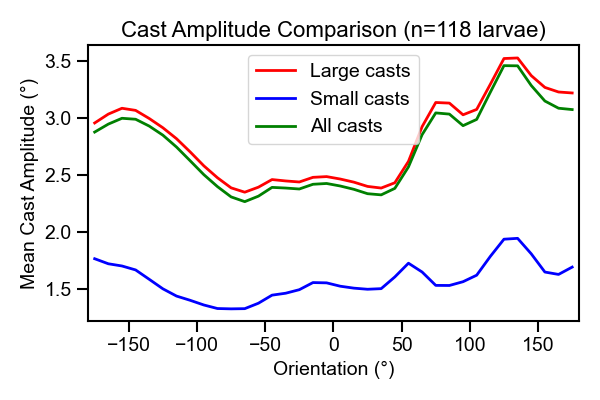

In [39]:
# Analyze all data
all_larvae_turns = trx_processor.analyze_turn_amplitudes_by_orientation(
    filtered_all_data
)

In [45]:
# Analyze turn rates in lateral quadrants
# lateral_stats = trx_processor.analyze_lateral_turn_rates(filtered_all_data, 
#                                          angle_width=15,
#                                          bin_width=5)

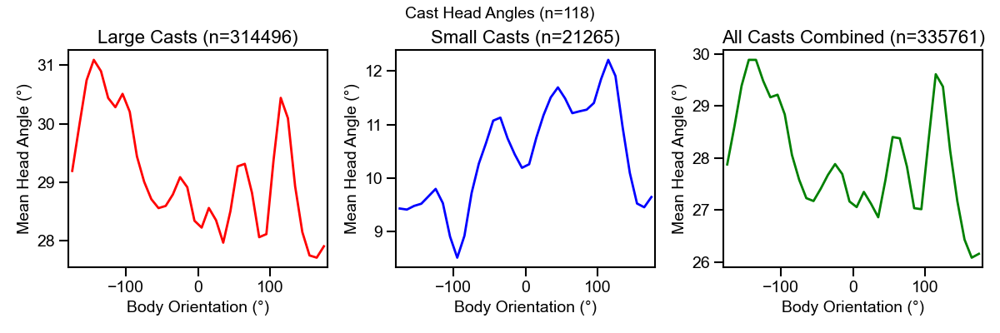

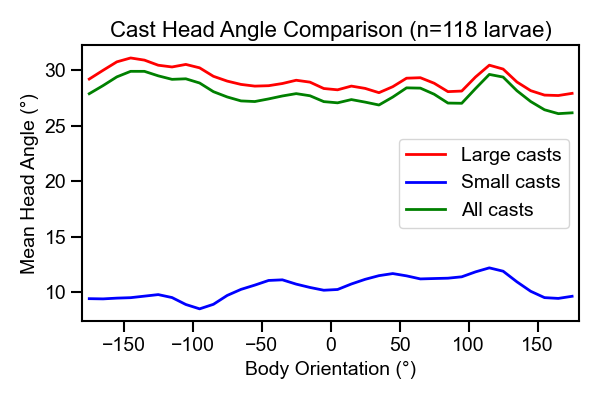

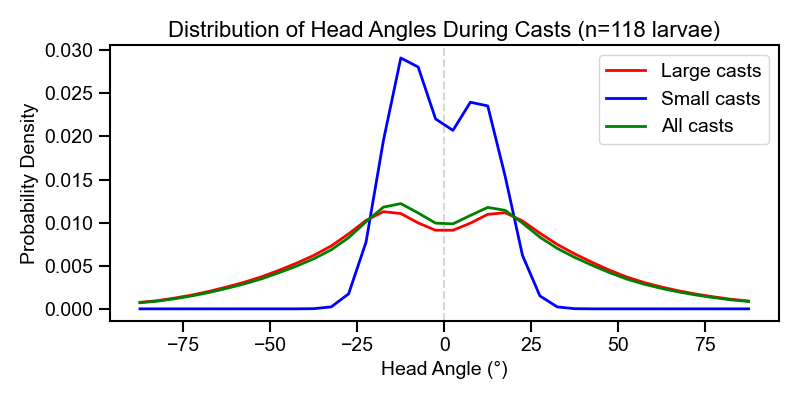

In [40]:
# Calculate head angles during cast events
head_angle_results = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data)

# If you want to analyze specific larvae
# single_larva_head_angles = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, larva_id="larva1")

# If you want to change bin width
# finer_bins = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, bin_width=5)

Analyzing Control...


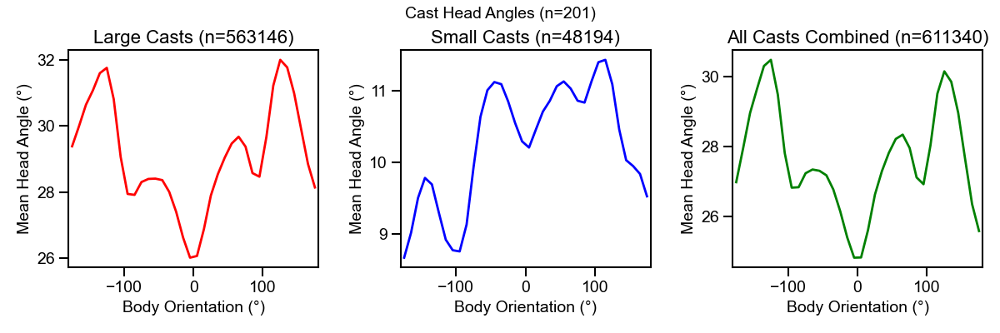

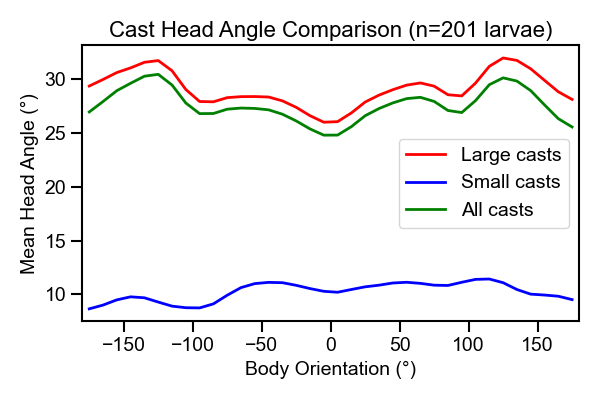

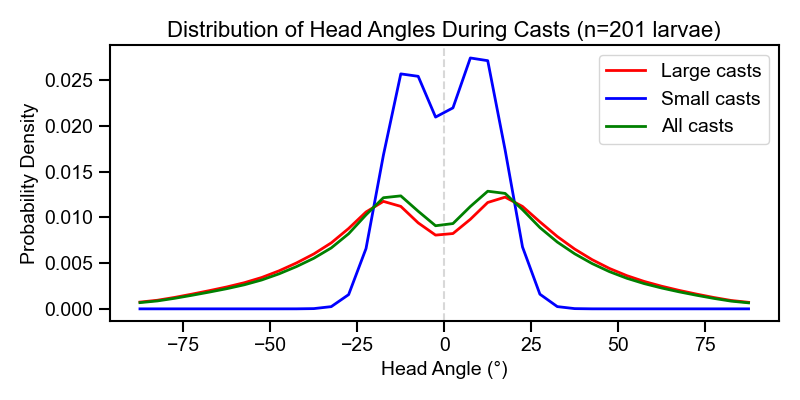

Analyzing Experimental...


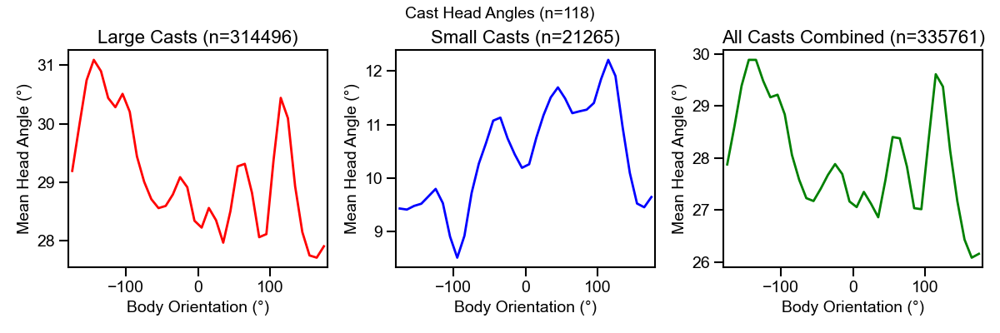

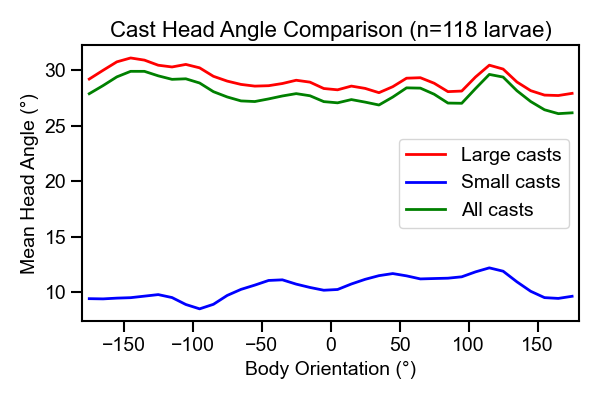

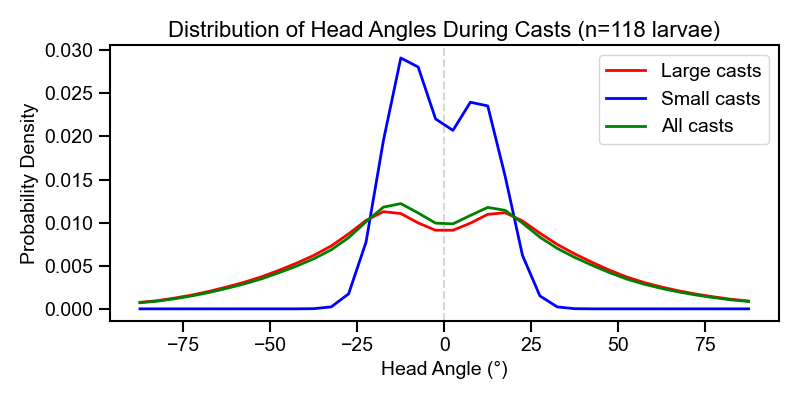

Saved comparison plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_comparison_Control_vs_Experimental_20250512_094832.svg


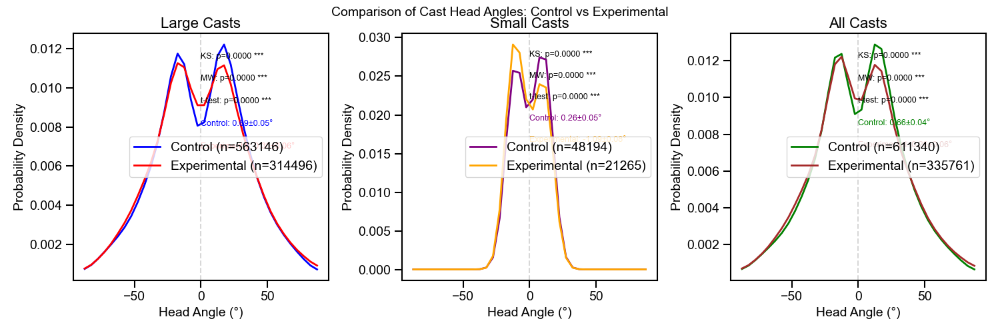

Saved boxplot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_boxplot_Control_vs_Experimental_20250512_094832.svg


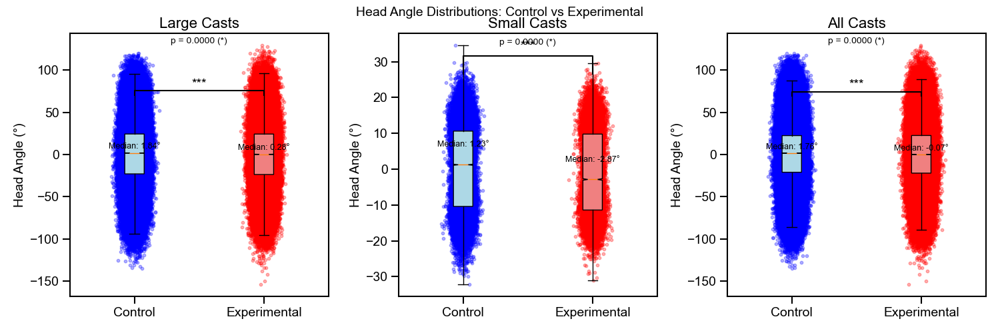

Saved orientation-dependent analysis to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_by_orientation_Control_vs_Experimental_20250512_094845.svg


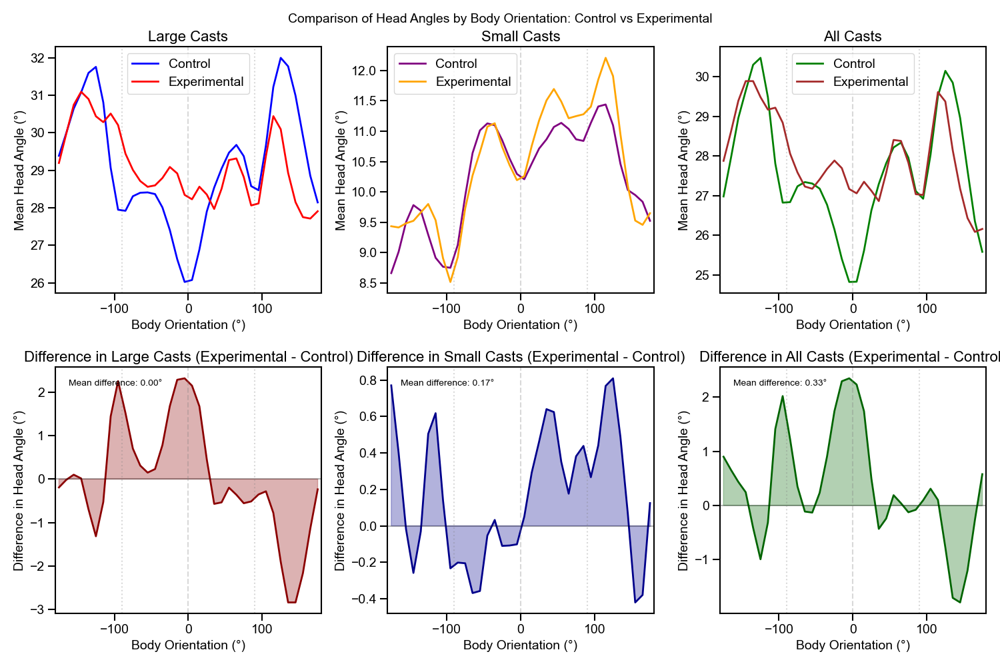


Summary of Cast Head Angle Comparison:
Comparing Control vs Experimental

Large Casts:
  Control: n=563146, mean=0.69±35.14°, median=1.84°
  Experimental: n=314496, mean=0.35±35.87°, median=0.28°
  Mean difference: -0.34°
  Median difference: -1.56°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000000 (significant)
  t-test: p=0.000017 (significant)

Small Casts:
  Control: n=48194, mean=0.26±11.47°, median=1.23°
  Experimental: n=21265, mean=-1.09±11.51°, median=-2.87°
  Mean difference: -1.35°
  Median difference: -4.10°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000000 (significant)
  t-test: p=0.000000 (significant)

All Casts:
  Control: n=611340, mean=0.66±33.88°, median=1.76°
  Experimental: n=335761, mean=0.26±34.84°, median=-0.07°
  Mean difference: -0.40°
  Median difference: -1.82°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000000 (significant)
  t-test: p=0.000000 (sign

In [42]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_cast_head_angles(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path  # Changed from base_path to basepath
)

Analyzing Control...


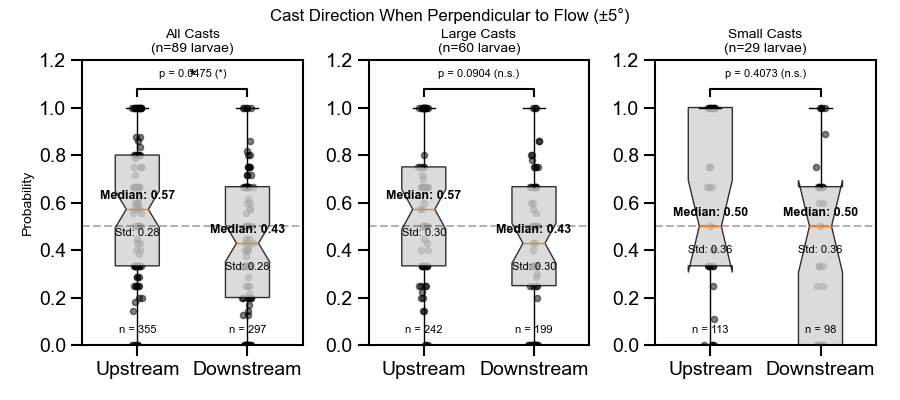

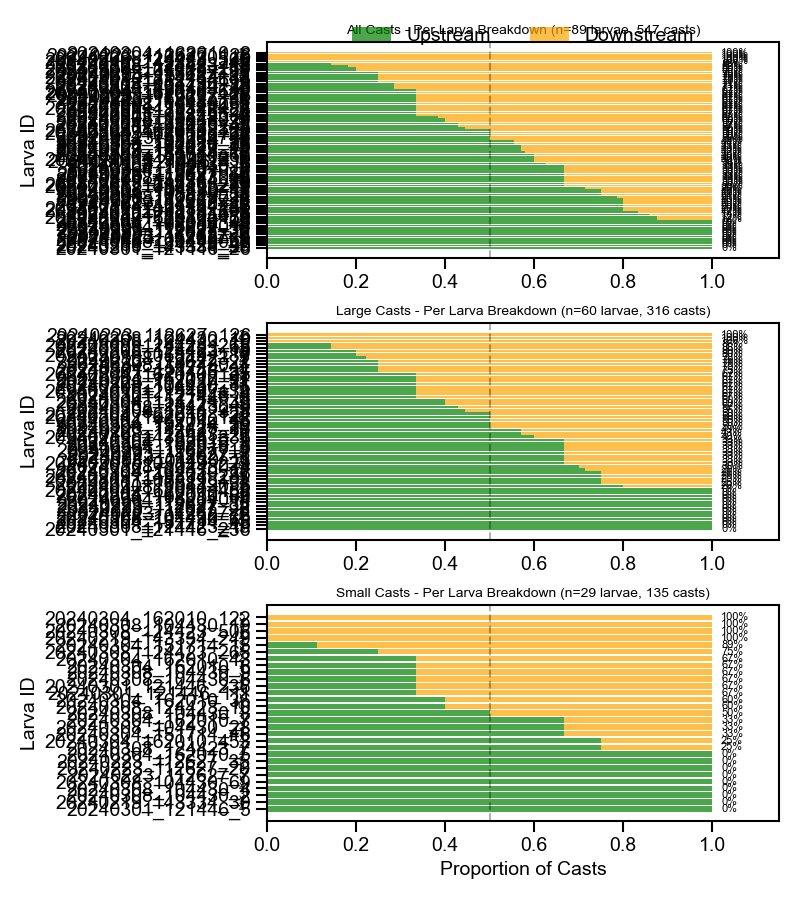


Summary of Cast Direction Analysis:
Analyzed 89 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 652 casts from 89 larvae
  Upstream: 355 (54.4%), Downstream: 297 (45.6%)
  Upstream mean: 0.561 ± 0.283 (std)
  Downstream mean: 0.439 ± 0.283 (std)
  Upstream median: 0.571
  Downstream median: 0.429
  Chi-Square Test: χ² = 5.16, p = 0.0231 (significant)
  Paired T-Test: t = 2.01, p = 0.0475 (significant)

Large Casts:
  Total: 441 casts from 60 larvae
  Upstream: 242 (54.9%), Downstream: 199 (45.1%)
  Upstream mean: 0.567 ± 0.300 (std)
  Downstream mean: 0.433 ± 0.300 (std)
  Upstream median: 0.571
  Downstream median: 0.429
  Chi-Square Test: χ² = 4.19, p = 0.0406 (significant)
  Paired T-Test: t = 1.72, p = 0.0904 (not significant)

Small Casts:
  Total: 211 casts from 29 larvae
  Upstream: 113 (53.6%), Downstream: 98 (46.4%)
  Upstream mean: 0.557 ± 0.360 (std)
  Downstream mean: 0.443 ± 0.360 (std)
  Upstream median: 0.500
  Downstream median: 0.50

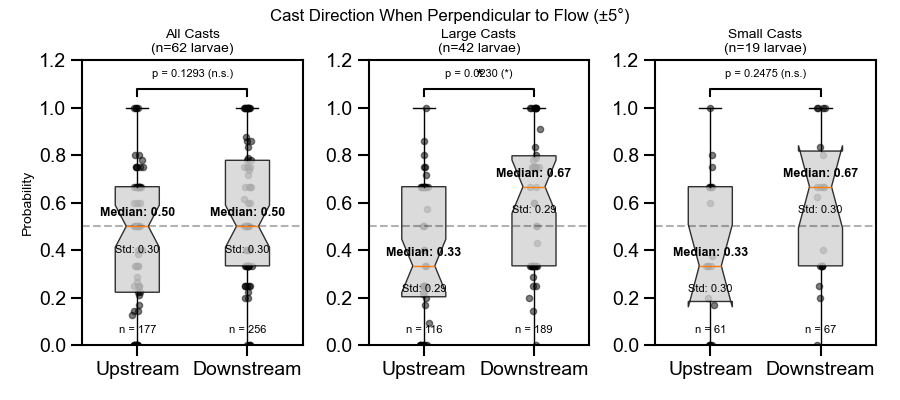

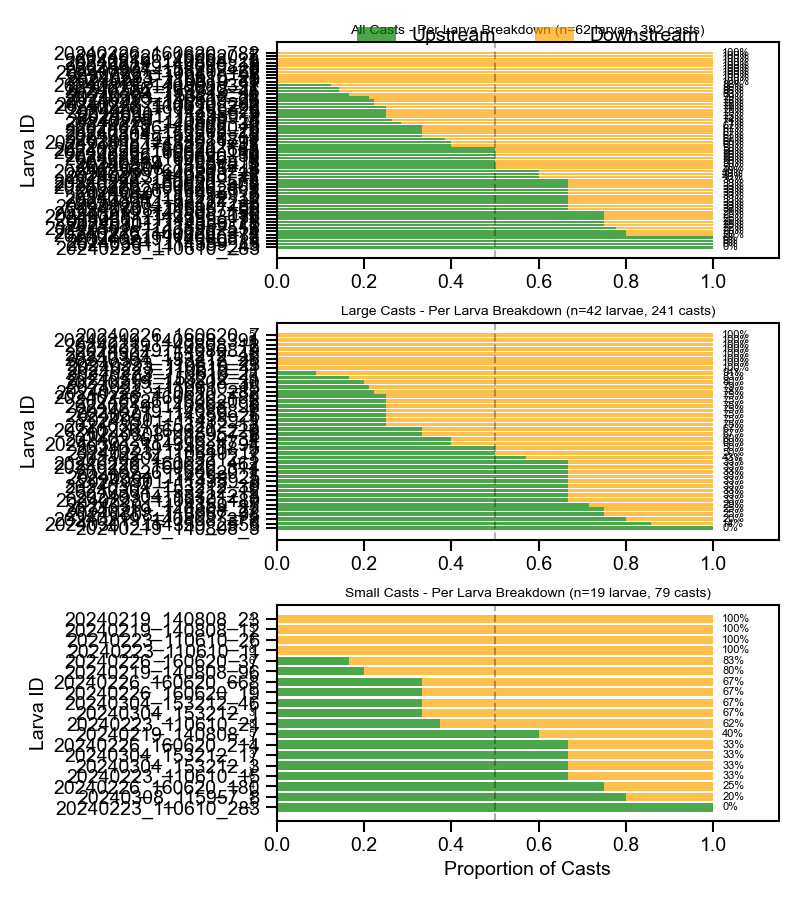


Summary of Cast Direction Analysis:
Analyzed 62 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 433 casts from 62 larvae
  Upstream: 177 (40.9%), Downstream: 256 (59.1%)
  Upstream mean: 0.442 ± 0.295 (std)
  Downstream mean: 0.558 ± 0.295 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 14.41, p = 0.0001 (significant)
  Paired T-Test: t = -1.54, p = 0.1293 (not significant)

Large Casts:
  Total: 305 casts from 42 larvae
  Upstream: 116 (38.0%), Downstream: 189 (62.0%)
  Upstream mean: 0.394 ± 0.287 (std)
  Downstream mean: 0.606 ± 0.287 (std)
  Upstream median: 0.333
  Downstream median: 0.667
  Chi-Square Test: χ² = 17.47, p = 0.0000 (significant)
  Paired T-Test: t = -2.36, p = 0.0230 (significant)

Small Casts:
  Total: 128 casts from 19 larvae
  Upstream: 61 (47.7%), Downstream: 67 (52.3%)
  Upstream mean: 0.415 ± 0.300 (std)
  Downstream mean: 0.585 ± 0.300 (std)
  Upstream median: 0.333
  Downstream median: 0

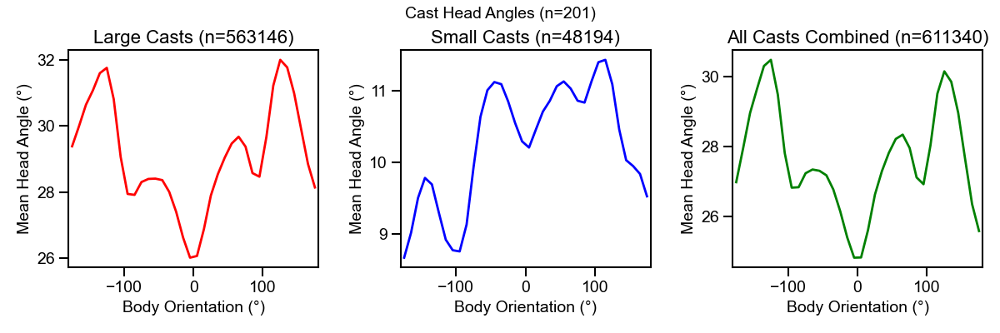

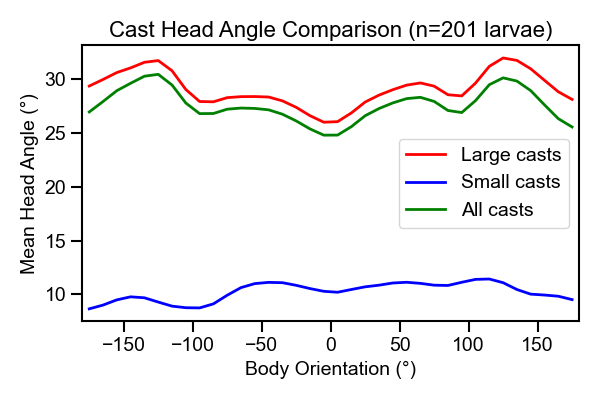

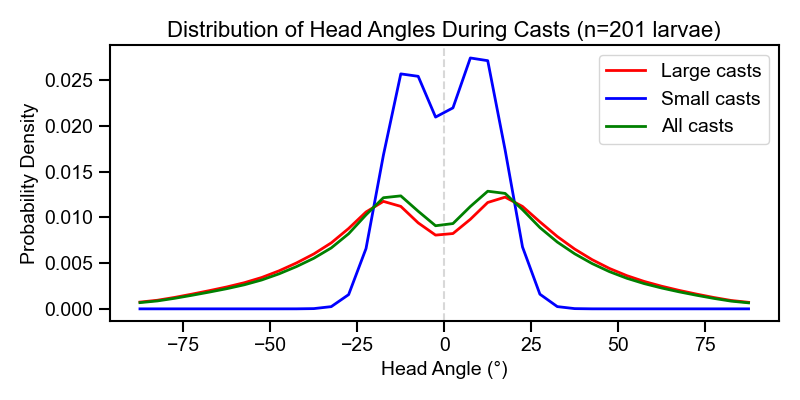

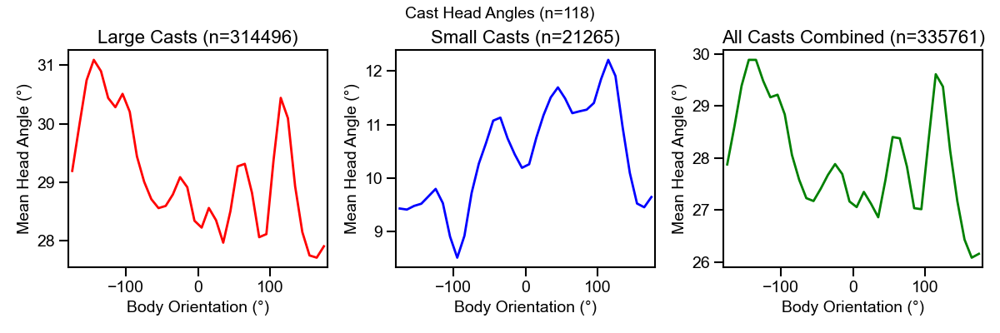

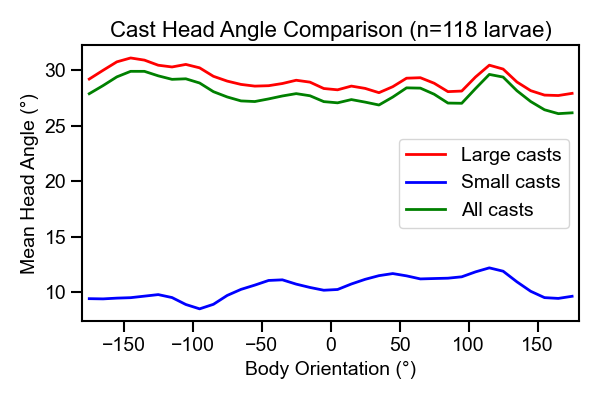

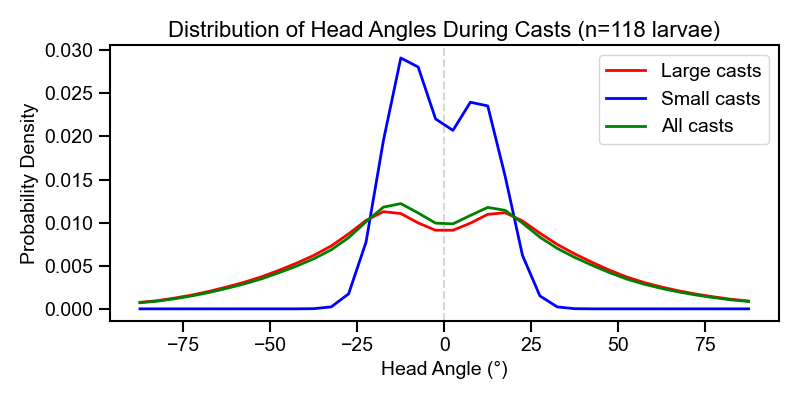

Saved head angle curves comparison to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_curves_comparison_Control_vs_Experimental_20250512_094846.svg


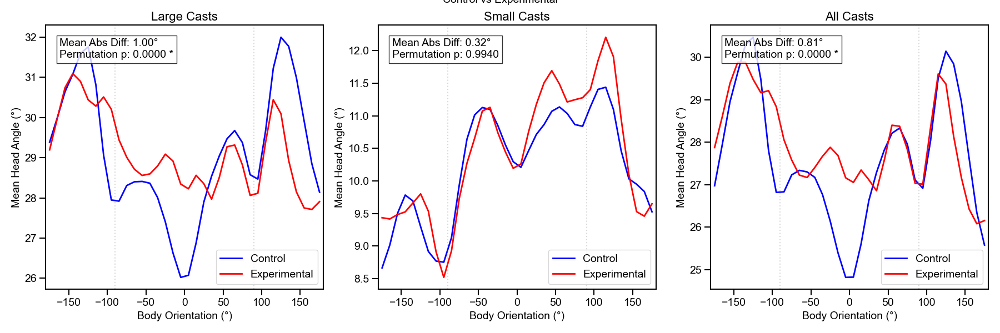

Saved head angle curves statistics to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_curves_stats_Control_vs_Experimental_20250512_094846.txt


In [43]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_cast_directions_new(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    basepath=base_path
)

Analyzing Control...


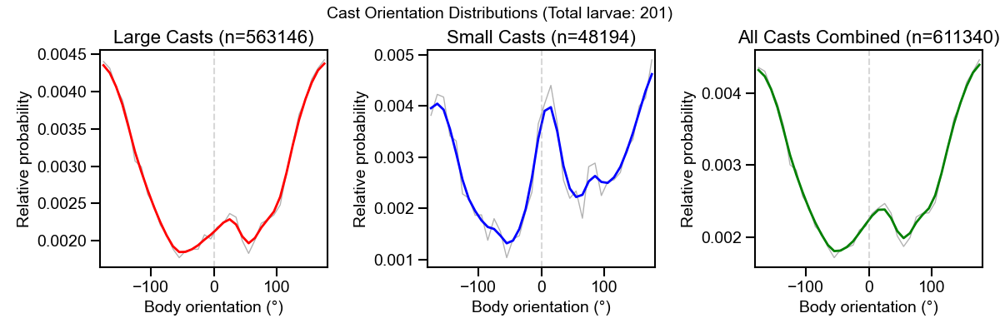

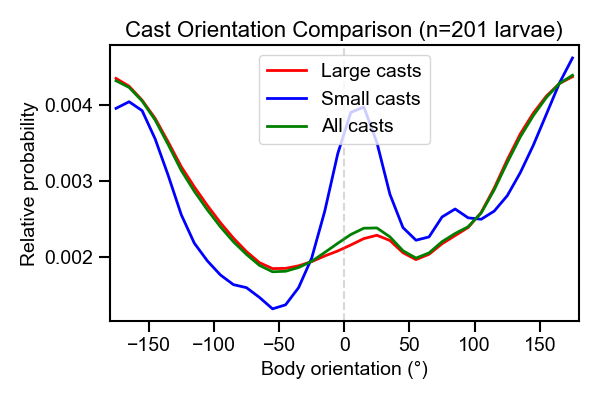

Analyzing Experimental...


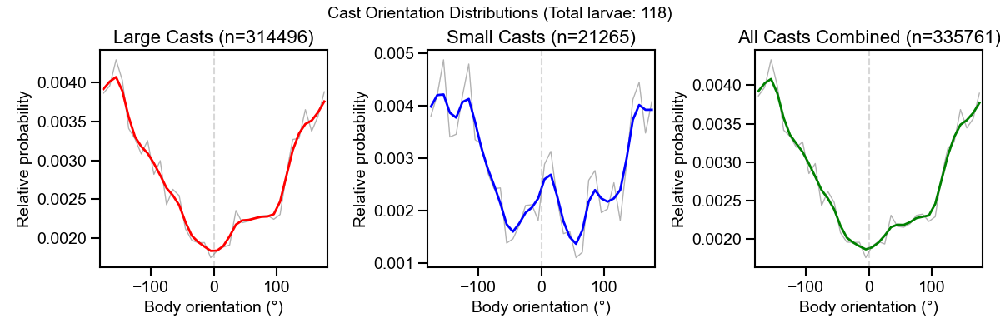

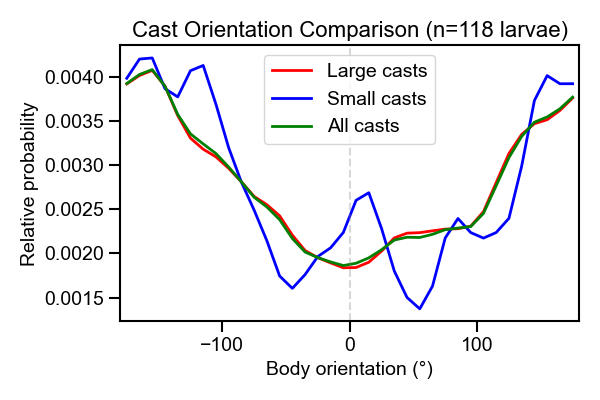

Saved comparison plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/cast_orientation_comparison_Control_vs_Experimental_20250512_095208.svg


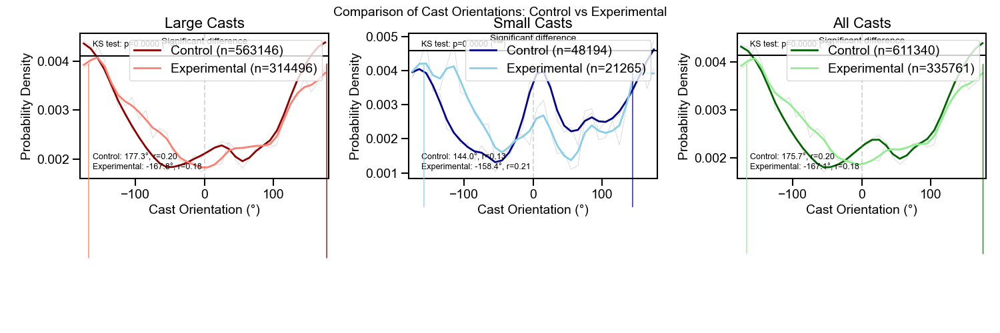

Saved circular plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/cast_orientation_circular_Control_vs_Experimental_20250512_095208.svg


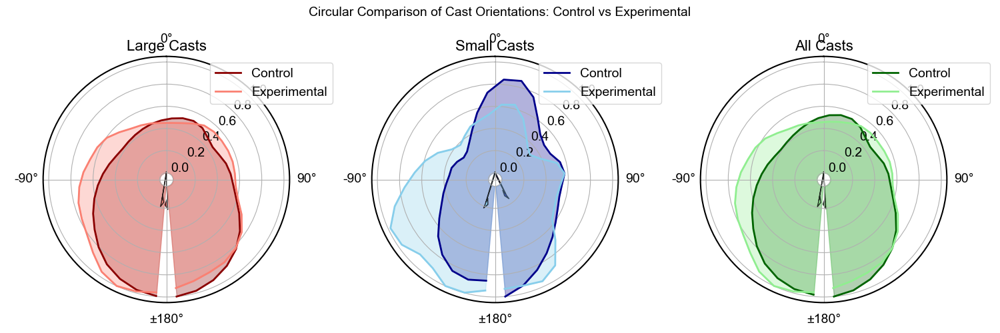


Summary of Cast Orientation Comparison:
Comparing Control vs Experimental

Large Casts:
  Control: n=563146, mean direction=177.3°, concentration=0.20
  Experimental: n=314496, mean direction=-167.8°, concentration=0.18
  Direction difference: 345.2°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

Small Casts:
  Control: n=48194, mean direction=144.0°, concentration=0.13
  Experimental: n=21265, mean direction=-158.4°, concentration=0.21
  Direction difference: 302.4°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

All Casts:
  Control: n=611340, mean direction=175.7°, concentration=0.20
  Experimental: n=335761, mean direction=-167.1°, concentration=0.18
  Direction difference: 342.8°
  Kolmogorov-Smirnov test: p=0.000000 (significant)


In [44]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_cast_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path
)

Analyzing Control...


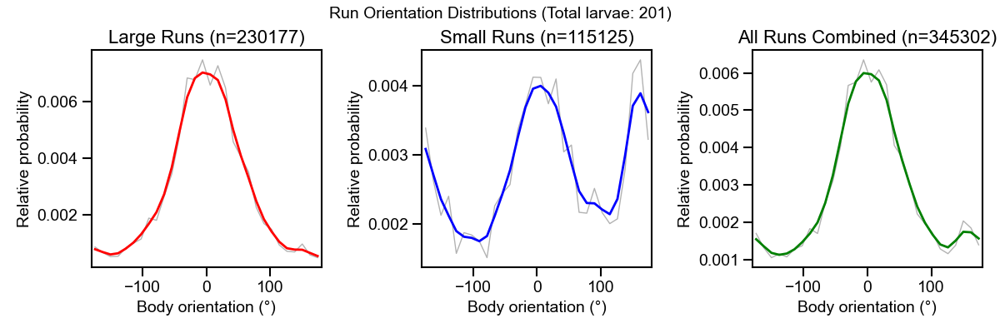

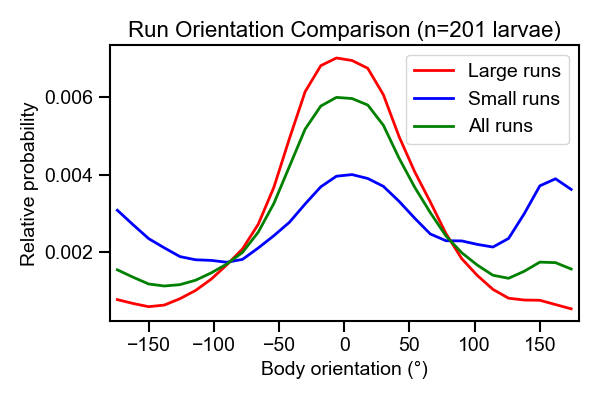

Analyzing Experimental...


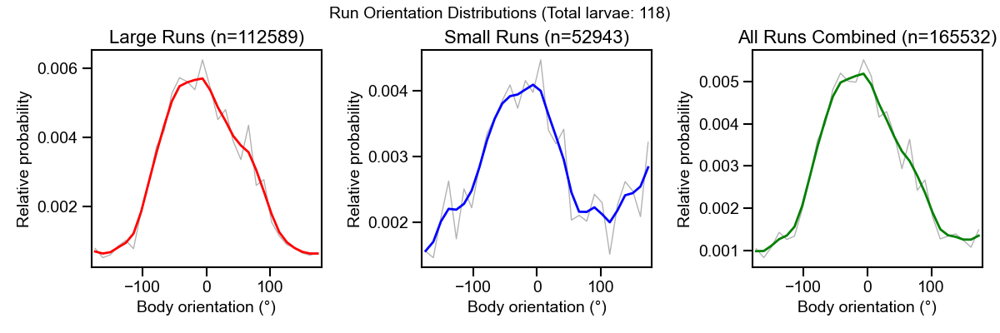

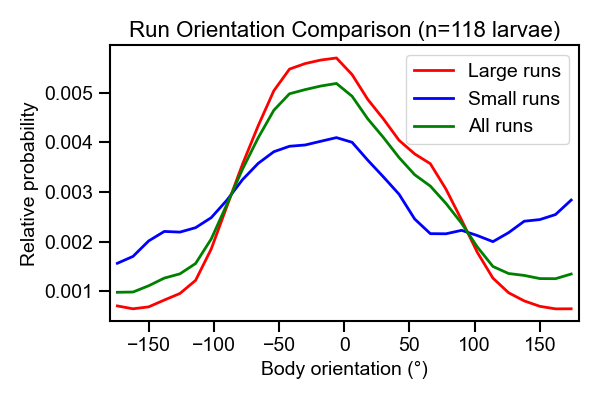

Saved comparison plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/run_orientation_comparison_Control_vs_Experimental_20250512_095218.svg


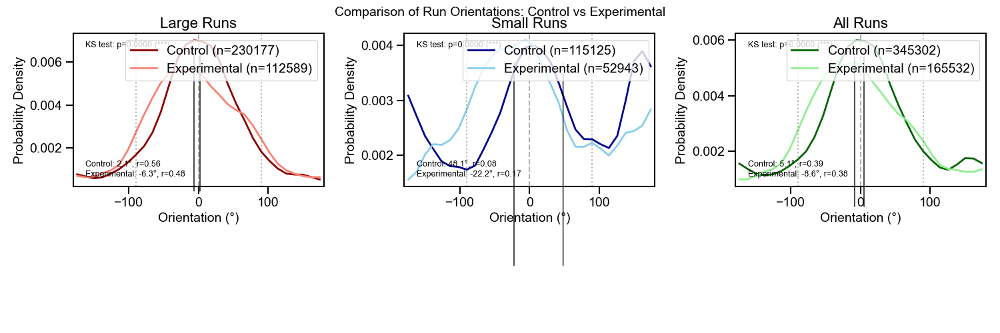

Saved circular plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/run_orientation_circular_Control_vs_Experimental_20250512_095219.svg


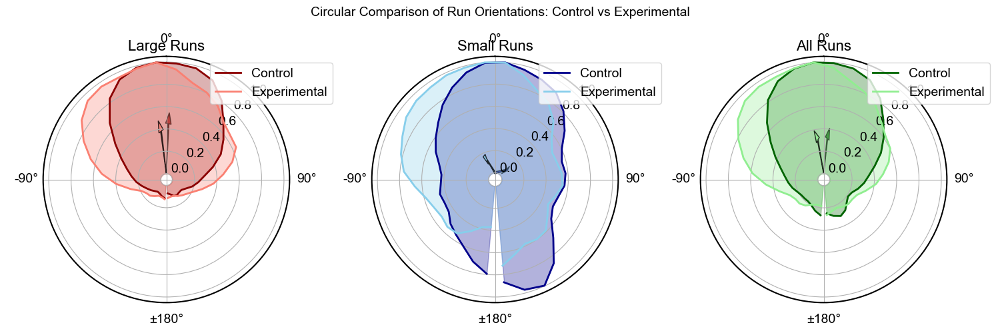


Summary of Run Orientation Comparison:
Comparing Control vs Experimental

Large Runs:
  Control: n=230177, mean direction=2.1°, concentration=0.56
  Experimental: n=112589, mean direction=-6.3°, concentration=0.48
  Direction difference: 351.6°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

Small Runs:
  Control: n=115125, mean direction=48.1°, concentration=0.08
  Experimental: n=52943, mean direction=-22.2°, concentration=0.17
  Direction difference: 289.6°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

All Runs:
  Control: n=345302, mean direction=5.1°, concentration=0.39
  Experimental: n=165532, mean direction=-8.6°, concentration=0.38
  Direction difference: 346.4°
  Kolmogorov-Smirnov test: p=0.000000 (significant)


In [45]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_run_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=12,
    basepath=base_path
)

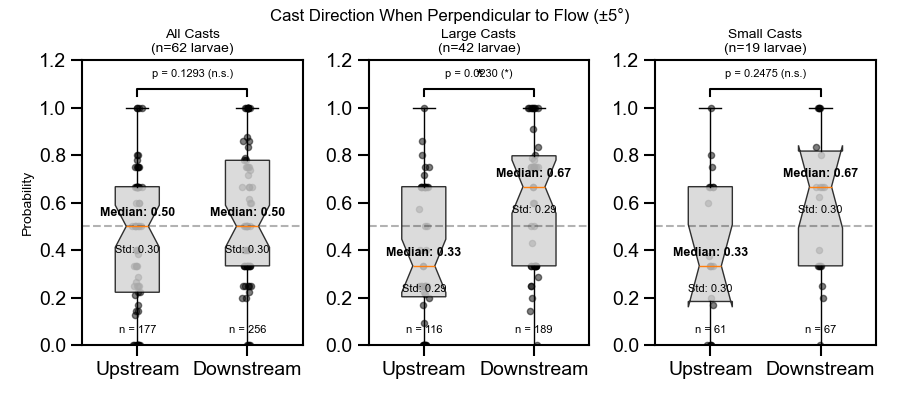

Saved boxplot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/perpendicular_cast_boxplot_angle5_20250512_095222.svg


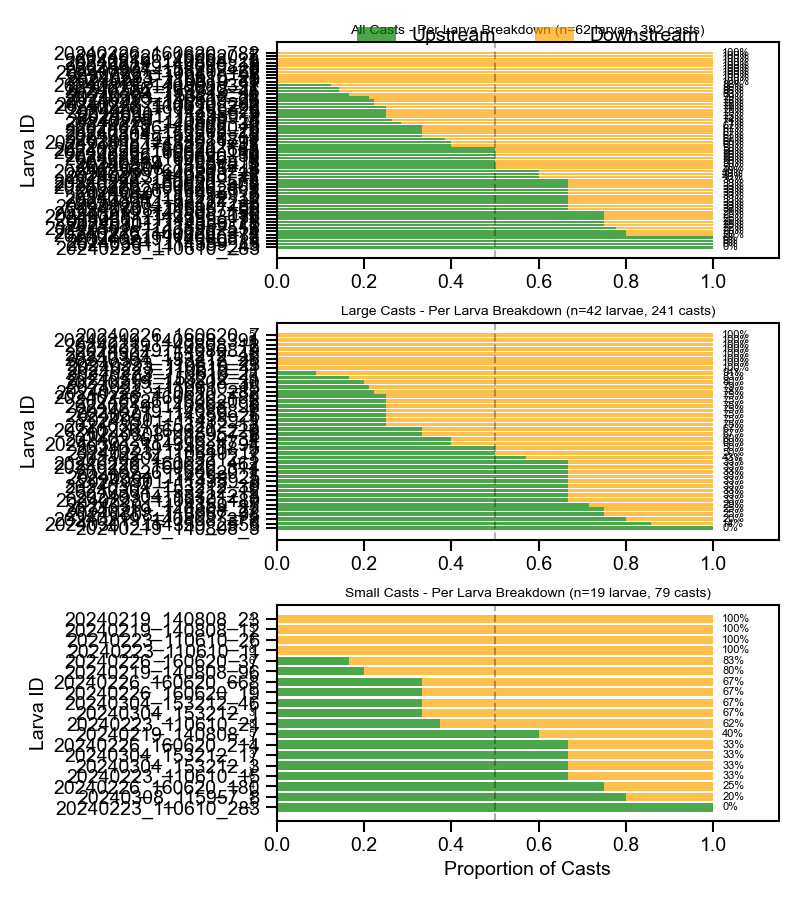


Summary of Cast Direction Analysis:
Analyzed 62 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 433 casts from 62 larvae
  Upstream: 177 (40.9%), Downstream: 256 (59.1%)
  Upstream mean: 0.442 ± 0.295 (std)
  Downstream mean: 0.558 ± 0.295 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 14.41, p = 0.0001 (significant)
  Paired T-Test: t = -1.54, p = 0.1293 (not significant)

Large Casts:
  Total: 305 casts from 42 larvae
  Upstream: 116 (38.0%), Downstream: 189 (62.0%)
  Upstream mean: 0.394 ± 0.287 (std)
  Downstream mean: 0.606 ± 0.287 (std)
  Upstream median: 0.333
  Downstream median: 0.667
  Chi-Square Test: χ² = 17.47, p = 0.0000 (significant)
  Paired T-Test: t = -2.36, p = 0.0230 (significant)

Small Casts:
  Total: 128 casts from 19 larvae
  Upstream: 61 (47.7%), Downstream: 67 (52.3%)
  Upstream mean: 0.415 ± 0.300 (std)
  Downstream mean: 0.585 ± 0.300 (std)
  Upstream median: 0.333
  Downstream median: 0

In [46]:
# Analyze cast directions relative to wind
cast_stats = trx_processor.analyze_perpendicular_cast_directions_new(filtered_all_data, angle_width=5, min_frame=3, basepath=base_path)

Analyzing Control...


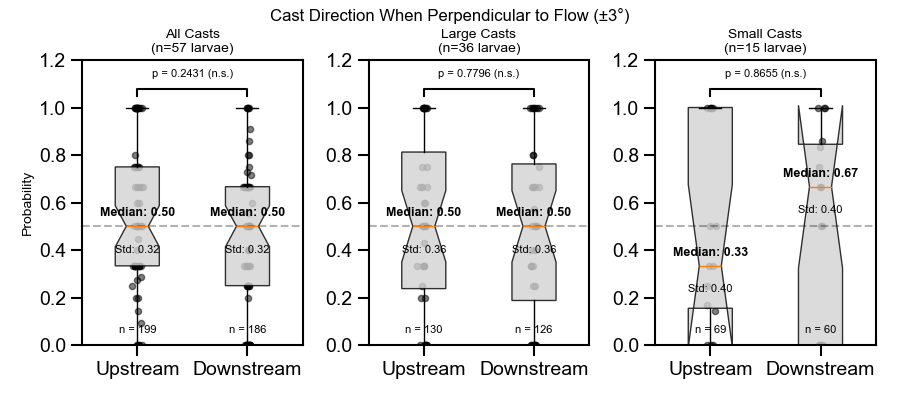

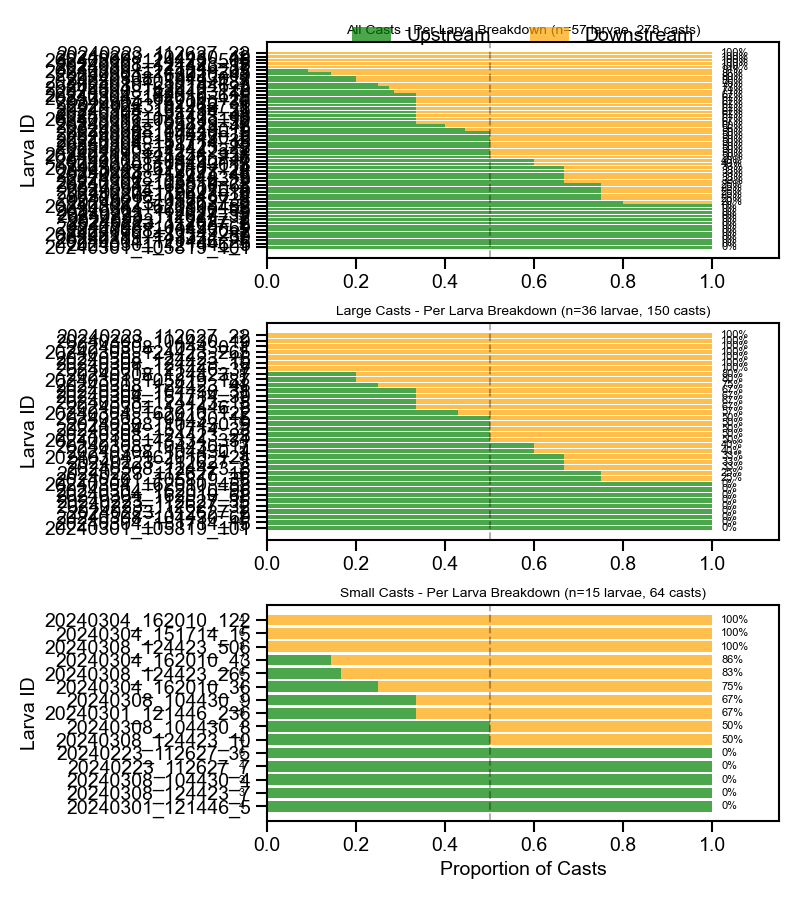


Summary of Cast Direction Analysis:
Analyzed 57 larvae with cast events during perpendicular orientation (±3°)

All Casts:
  Total: 385 casts from 57 larvae
  Upstream: 199 (51.7%), Downstream: 186 (48.3%)
  Upstream mean: 0.550 ± 0.319 (std)
  Downstream mean: 0.450 ± 0.319 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 0.44, p = 0.5076 (not significant)
  Paired T-Test: t = 1.18, p = 0.2431 (not significant)

Large Casts:
  Total: 256 casts from 36 larvae
  Upstream: 130 (50.8%), Downstream: 126 (49.2%)
  Upstream mean: 0.517 ± 0.357 (std)
  Downstream mean: 0.483 ± 0.357 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 0.06, p = 0.8026 (not significant)
  Paired T-Test: t = 0.28, p = 0.7796 (not significant)

Small Casts:
  Total: 129 casts from 15 larvae
  Upstream: 69 (53.5%), Downstream: 60 (46.5%)
  Upstream mean: 0.482 ± 0.396 (std)
  Downstream mean: 0.518 ± 0.396 (std)
  Upstream median: 0.333
  Downstream m

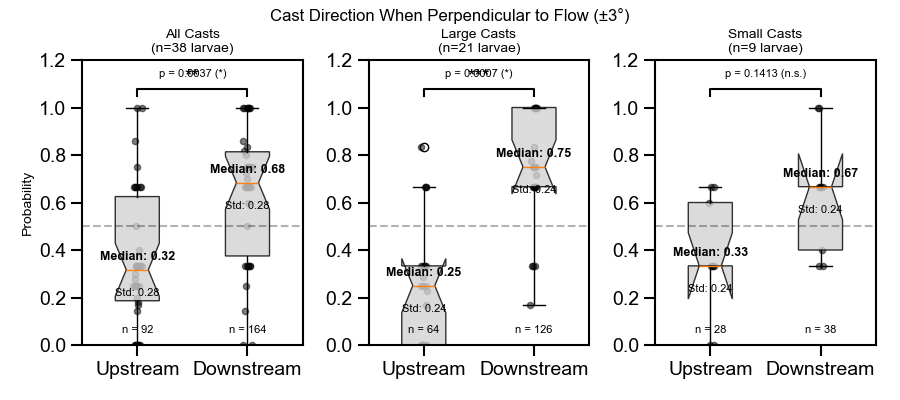

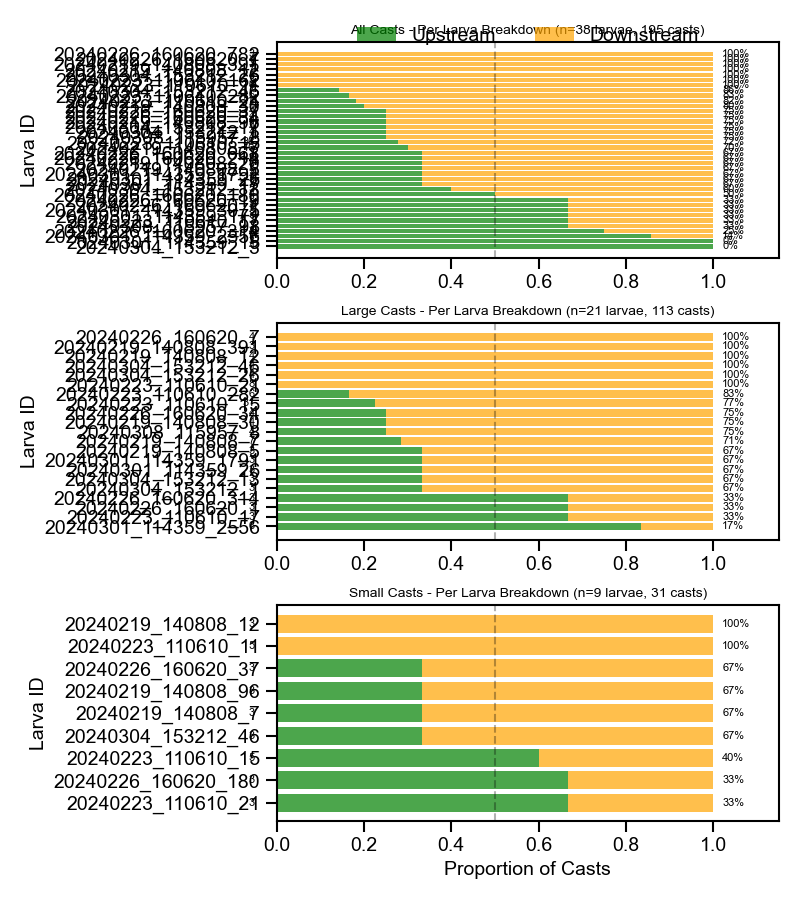


Summary of Cast Direction Analysis:
Analyzed 38 larvae with cast events during perpendicular orientation (±3°)

All Casts:
  Total: 256 casts from 38 larvae
  Upstream: 92 (35.9%), Downstream: 164 (64.1%)
  Upstream mean: 0.358 ± 0.278 (std)
  Downstream mean: 0.642 ± 0.278 (std)
  Upstream median: 0.317
  Downstream median: 0.683
  Chi-Square Test: χ² = 20.25, p = 0.0000 (significant)
  Paired T-Test: t = -3.10, p = 0.0037 (significant)

Large Casts:
  Total: 190 casts from 21 larvae
  Upstream: 64 (33.7%), Downstream: 126 (66.3%)
  Upstream mean: 0.282 ± 0.245 (std)
  Downstream mean: 0.718 ± 0.245 (std)
  Upstream median: 0.250
  Downstream median: 0.750
  Chi-Square Test: χ² = 20.23, p = 0.0000 (significant)
  Paired T-Test: t = -3.98, p = 0.0007 (significant)

Small Casts:
  Total: 66 casts from 9 larvae
  Upstream: 28 (42.4%), Downstream: 38 (57.6%)
  Upstream mean: 0.363 ± 0.237 (std)
  Downstream mean: 0.637 ± 0.237 (std)
  Upstream median: 0.333
  Downstream median: 0.667
  C

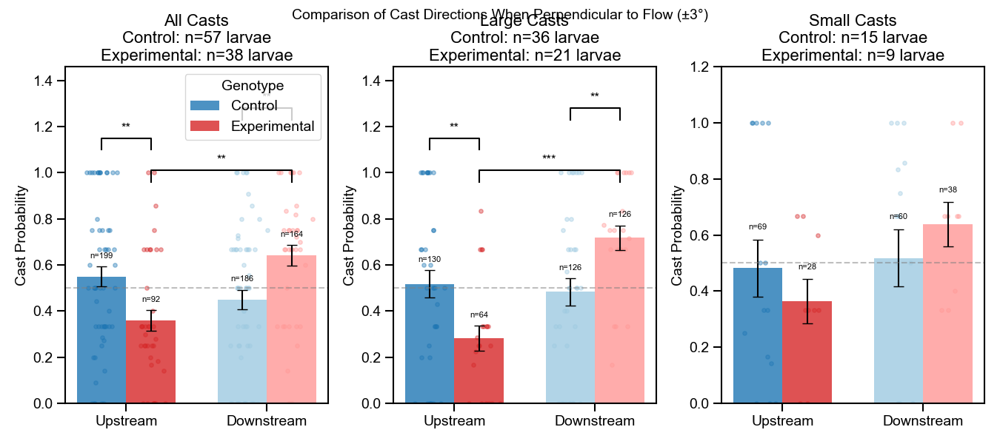

Saved statistical results to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_stats_Control_vs_Experimental_20250512_095226.txt


In [47]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_cast_directions_perpendicular(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=3,
    min_frame=3,
    basepath=basepath
)

In [49]:
# # Or let the function pick a random larva with good data
# results = trx_processor.analyze_cast_head_dynamics(filtered_all_data)


# # Print the statistics
# print(f"Analysis for larva {results['larva_id']}:")
# print(f"Number of cast events: {results['n_events']}")
# print(f"Mean cast duration: {results['mean_duration']:.3f}s")
# print(f"Mean max downer-upper angle: {results['mean_max_angle_du']:.2f} degrees")
# print(f"Mean max bend angle: {results['mean_max_bend_angle']:.2f} degrees")
# print(f"Mean bend amplitude during casts: {results['mean_bend_amplitude']:.2f} degrees")

In [50]:
# # Import libraries
# import numpy as np
# import matplotlib.pyplot as plt
# from src import trx_processor

# # Apply the analysis function
# results = trx_processor.analyze_perpendicular_cast_directions(filtered_all_data, angle_width=45)

# # Print summary statistics
# print(f"Analysis completed for {results['larvae_processed']} larvae")
# print(f"Total casts analyzed: {sum(results['total_counts'].values())}")

# # Print probabilities
# print("\nCast Direction Probabilities:")
# print(f"  Upstream: {results['probabilities']['upstream']:.3f} ({results['total_counts']['upstream']} casts)")
# print(f"  Downstream: {results['probabilities']['downstream']:.3f} ({results['total_counts']['downstream']} casts)")

# # Print statistical results
# chi2, p_chi2 = results['chi2_result']
# significance = "*" * sum([p_chi2 < threshold for threshold in [0.05, 0.01, 0.001]])
# print(f"\nChi-square test results:")
# print(f"  chi2: {chi2:.4f}")
# print(f"  p-value: {p_chi2:.4f} {significance}")

# # Add t-test results if available
# if results['ttest_result'] is not None:
#     t_stat, p_val = results['ttest_result']
#     significance = "*" * sum([p_val < threshold for threshold in [0.05, 0.01, 0.001]])
#     print(f"\nPaired t-test results:")
#     print(f"  t-statistic: {t_stat:.4f}")
#     print(f"  p-value: {p_val:.4f} {significance}")

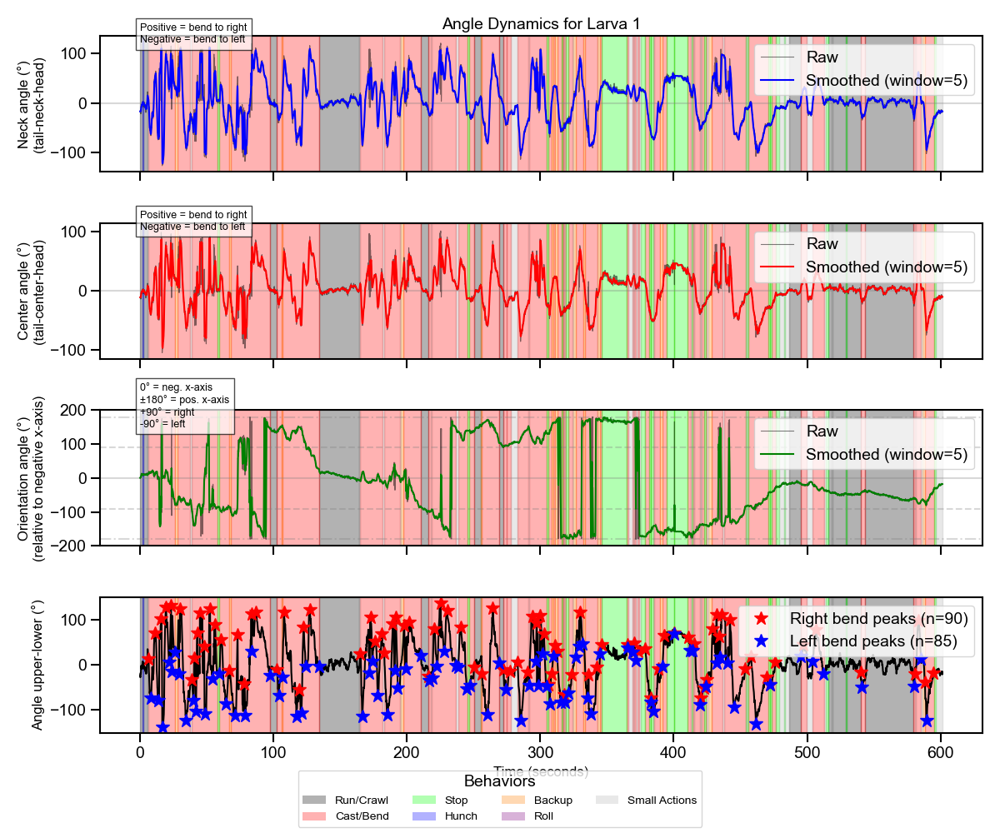

Plotted angle dynamics for larva 1 over 601.1 seconds
Detected 90 right bend peaks and 85 left bend peaks during cast/bend events


{'larva_id': 1,
 'time': array([2.26000e-01, 2.79000e-01, 3.40000e-01, ..., 6.01128e+02,
        6.01216e+02, 6.01302e+02], shape=(7004,)),
 'angle_neck': array([-16.77439361, -16.05677495, -18.22749915, ..., -18.94684648,
        -17.7251017 , -15.80699787], shape=(7004,)),
 'angle_neck_smooth': array([-16.79513302, -16.85720651, -16.84346803, ..., -17.29265263,
        -17.24883844, -17.04983481], shape=(7004,)),
 'angle_center': array([-11.89919379, -11.46424441, -11.1200954 , ..., -12.96188678,
        -11.55399436,  -9.83170958], shape=(7004,)),
 'angle_center_smooth': array([-11.57188357, -11.44860916, -11.25697511, ..., -11.24827941,
        -11.20512551, -11.00695116], shape=(7004,)),
 'orientation_angle': array([ -0.12436591,   0.44065375,   3.10651856, ..., -17.85825269,
        -17.73014308, -17.41362341], shape=(7004,)),
 'orientation_angle_smooth': array([  0.79432463,   1.17180067,   1.62454723, ..., -17.76632659,
        -17.70533465, -17.63919002], shape=(7004,)),
 'ang

In [51]:
# trx_processor.plot_larva_angle_dynamics(filtered_all_data)
# Or with specific larva:
trx_processor.plot_larva_angle_dynamics(filtered_extracted_data, larva_id=1)


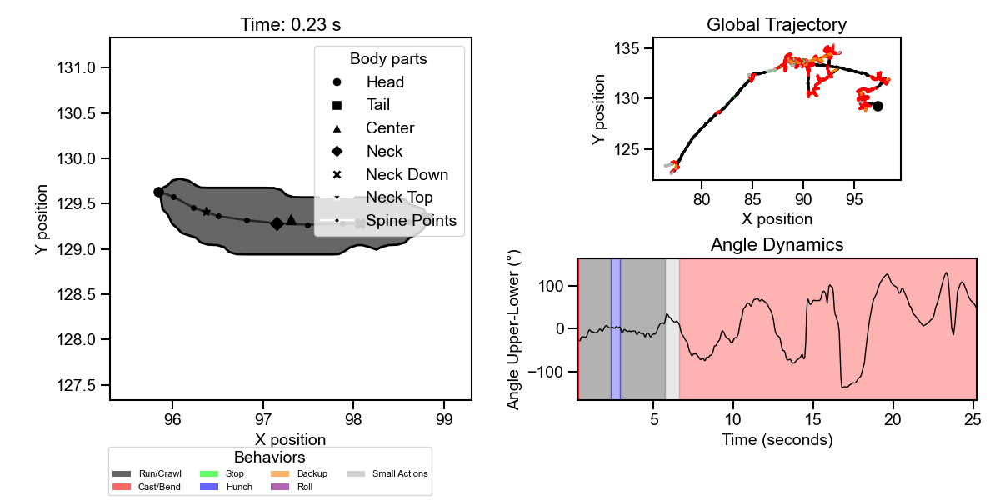

In [52]:
first_larva = sorted(filtered_extracted_data.keys())[0]
trx_processor.plot_behavioral_contour_with_global_trajectory(filtered_extracted_data, first_larva)

/Users/sharbat/Projects/anemotaxis/src/trx_processor.py:4424: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(['90°\n(Right)', '45°', '0°\n(Downstream)', '-45°', '-90°\n(Left)', '-135°', '±180°\n(Upstream)', '135°'])


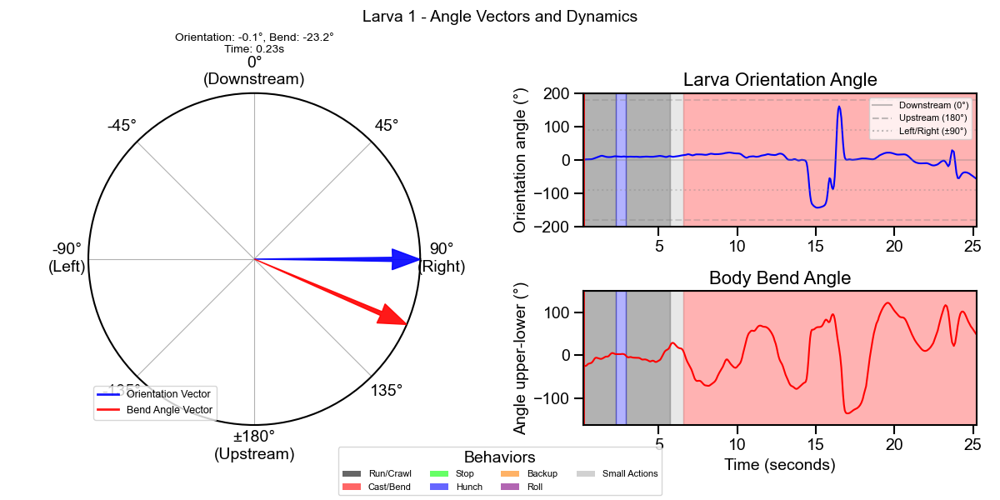

{'larva_id': 1,
 'time': array([2.26000e-01, 2.79000e-01, 3.40000e-01, ..., 6.01128e+02,
        6.01216e+02, 6.01302e+02], shape=(7004,)),
 'orientation_angles': array([ -0.12436591,   0.44065375,   3.10651856, ..., -17.85825269,
        -17.73014308, -17.41362341], shape=(7004,)),
 'orientation_angles_smooth': array([  0.79432463,   1.17180067,   1.62454723, ..., -17.76632659,
        -17.70533465, -17.63919002], shape=(7004,)),
 'angle_upper_lower_deg': array([-23.21821746, -24.37152162, -27.69066051, ..., -21.29740925,
        -18.80110414, -15.63608815], shape=(7004,)),
 'angle_upper_lower_deg_smooth': array([-24.53870509, -24.87097655, -24.945846  , ..., -18.73984373,
        -18.35516567, -17.86250113], shape=(7004,)),
 'states': array([1., 1., 1., ..., 7., 7., 7.], shape=(7004,))}

In [81]:
first_larva = sorted(filtered_extracted_data.keys())[0]
trx_processor.plot_larva_angle_vectors(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)


/Users/sharbat/Projects/anemotaxis/src/trx_processor.py:4907: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_polar.set_xticklabels(['90°\n(R)', '45°', '0°\n(D)', '315°', '270°\n(L)', '225°', '180°\n(U)', '135°'],


/Users/sharbat/Projects/anemotaxis/src/trx_processor.py:5214: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


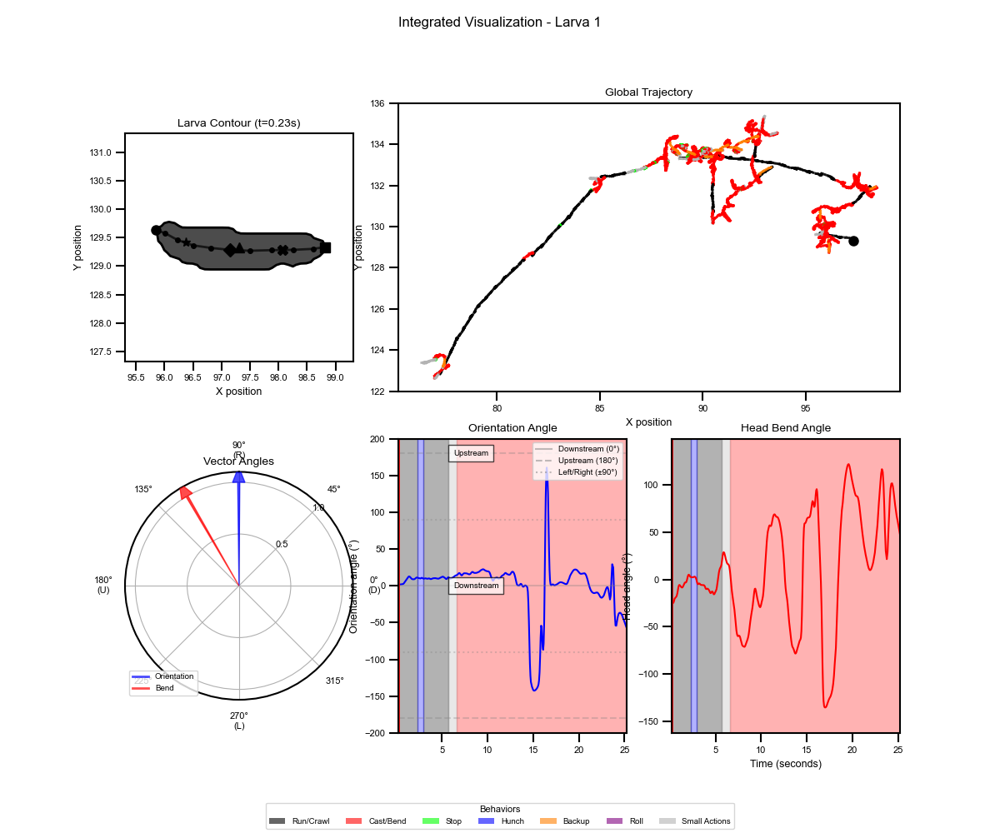

{'larva_id': 1,
 'time': array([2.26000e-01, 2.79000e-01, 3.40000e-01, ..., 6.01128e+02,
        6.01216e+02, 6.01302e+02], shape=(7004,)),
 'orientation_angles': array([ -0.12436591,   0.44065375,   3.10651856, ..., -17.85825269,
        -17.73014308, -17.41362341], shape=(7004,)),
 'orientation_angles_smooth': array([  0.79432463,   1.17180067,   1.62454723, ..., -17.76632659,
        -17.70533465, -17.63919002], shape=(7004,)),
 'angle_upper_lower_deg': array([-23.21821746, -24.37152162, -27.69066051, ..., -21.29740925,
        -18.80110414, -15.63608815], shape=(7004,)),
 'angle_upper_lower_deg_smooth': array([-24.53870509, -24.87097655, -24.945846  , ..., -18.73984373,
        -18.35516567, -17.86250113], shape=(7004,)),
 'states': array([1., 1., 1., ..., 7., 7., 7.], shape=(7004,))}

In [54]:
first_larva = sorted(filtered_extracted_data.keys())[0]
trx_processor.plot_larva_integrated_visualization(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)


In [55]:
# Run the analysis
results = trx_processor.compare_genotype_distributions_by_date()

Found 6 experiment dates for SS01948
Found 6 experiment dates for SS01757
Found 8 experiment dates for control
Processing genotype: SS01948
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_140808/trx.mat


Processing larvae:   0%|          | 0/59 [00:00<?, ?it/s]

  Error processing SS01948, 20240219_140808: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240223_110610/trx.mat


Processing larvae:   0%|          | 0/39 [00:00<?, ?it/s]

  Error processing SS01948, 20240223_110610: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_160620/trx.mat


Processing larvae:   0%|          | 0/74 [00:00<?, ?it/s]

  Error processing SS01948, 20240226_160620: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_114359/trx.mat


Processing larvae:   0%|          | 0/51 [00:00<?, ?it/s]

  Error processing SS01948, 20240301_114359: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_153212/trx.mat


Processing larvae:   0%|          | 0/23 [00:00<?, ?it/s]

  Error processing SS01948, 20240304_153212: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240308_115957/trx.mat


Processing larvae:   0%|          | 0/10 [00:00<?, ?it/s]

  Error processing SS01948, 20240308_115957: 'tuple' object has no attribute 'items'
Processing genotype: SS01757
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_145347/trx.mat


Processing larvae:   0%|          | 0/46 [00:00<?, ?it/s]

  Error processing SS01757, 20240219_145347: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240223_120812/trx.mat


Processing larvae:   0%|          | 0/41 [00:00<?, ?it/s]

  Error processing SS01757, 20240223_120812: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_165304/trx.mat


Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

  Error processing SS01757, 20240226_165304: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_104205/trx.mat


Processing larvae:   0%|          | 0/58 [00:00<?, ?it/s]

  Error processing SS01757, 20240301_104205: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_150157/trx.mat


Processing larvae:   0%|          | 0/47 [00:00<?, ?it/s]

  Error processing SS01757, 20240304_150157: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240308_121454/trx.mat


Processing larvae:   0%|          | 0/37 [00:00<?, ?it/s]

  Error processing SS01757, 20240308_121454: 'tuple' object has no attribute 'items'
Processing genotype: control
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/trx.mat


Processing larvae:   0%|          | 0/65 [00:00<?, ?it/s]

  Error processing control, 20240219_143334: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240223_112627/trx.mat


Processing larvae:   0%|          | 0/41 [00:00<?, ?it/s]

  Error processing control, 20240223_112627: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_105819/trx.mat


Processing larvae:   0%|          | 0/71 [00:00<?, ?it/s]

  Error processing control, 20240301_105819: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_121446/trx.mat


Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

  Error processing control, 20240301_121446: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_151714/trx.mat


Processing larvae:   0%|          | 0/47 [00:00<?, ?it/s]

  Error processing control, 20240304_151714: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_162010/trx.mat


Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

  Error processing control, 20240304_162010: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240308_104430/trx.mat


Processing larvae:   0%|          | 0/38 [00:00<?, ?it/s]

  Error processing control, 20240308_104430: 'tuple' object has no attribute 'items'
  Loading /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240308_124423/trx.mat


Processing larvae:   0%|          | 0/39 [00:00<?, ?it/s]

  Error processing control, 20240308_124423: 'tuple' object has no attribute 'items'
No data available to compare
